Are there particular locations in Toronto where AirBnb listings fetch higher prices?

In [1]:
# Importing required libraries
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import matplotlib
sb.set()

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
# Importing the listing dataset
listingsDF = pd.read_csv('/content/listings.csv')
listingsDF.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,1419,https://www.airbnb.com/rooms/1419,20230309202131,2023-03-10,previous scrape,Beautiful home in amazing area!,"This large, family home is located in one of T...",The apartment is located in the Ossington stri...,https://a0.muscache.com/pictures/76206750/d643...,1565,https://www.airbnb.com/users/show/1565,Alexandra,2008-08-08,"Vancouver, Canada","I live in Vancouver, Canada with my husband an...",NaN,NaN,NaN,f,https://a0.muscache.com/im/pictures/user/7aeea...,https://a0.muscache.com/im/pictures/user/7aeea...,Commercial Drive,1.0,1.0,"['email', 'phone']",t,t,"Toronto, Ontario, Canada",Little Portugal,NaN,43.64590,-79.42423,Entire home,Entire home/apt,10,NaN,3 baths,5.0,7.0,"[""Wifi"", ""Kitchen"", ""First aid kit"", ""Dryer"", ...",$469.00,28,730,28,28,730,730,28.0,730.0,NaN,t,0,0,0,0,2023-03-10,7,0,0,2015-07-19,2017-12-04,5.00,5.00,5.00,5.00,5.00,5.00,5.00,NaN,f,1,1,0,0,0.08
1,8077,https://www.airbnb.com/rooms/8077,20230309202131,2023-03-10,city scrape,Downtown Harbourfront Private Room,Guest room in a luxury condo with access to al...,NaN,https://a0.muscache.com/pictures/11780344/141c...,22795,https://www.airbnb.com/users/show/22795,Kathie & Larry,2009-06-22,"Toronto, Canada",My husband and I have been airbnb host for alm...,NaN,NaN,NaN,f,https://a0.muscache.com/im/pictures/user/9a077...,https://a0.muscache.com/im/pictures/user/9a077...,Harbourfront,2.0,3.0,"['email', 'phone']",t,f,NaN,Waterfront Communities-The Island,NaN,43.64080,-79.37673,Private room in rental unit,Private room,2,NaN,1.5 baths,1.0,1.0,"[""Wifi"", ""Gym"", ""Pool"", ""Free parking on premi...",$104.00,180,365,180,180,365,365,180.0,365.0,NaN,t,30,60,90,365,2023-03-10,169,0,0,2009-08-20,2013-08-27,4.84,4.81,4.89,4.87,4.90,4.92,4.83,NaN,t,2,1,1,0,1.02
2,26654,https://www.airbnb.com/rooms/26654,20230309202131,2023-03-10,city scrape,World Class downtown @CN Tower Theatre MTCC ga...,"CN Tower, TIFF Bell Lightbox, Metro Convention...",There's a reason they call it the Entertainmen...,https://a0.muscache.com/pictures/81811785/5dcd...,113345,https://www.airbnb.com/users/show/113345,Adela,2010-04-25,"Toronto, Canada",Welcome to Toronto! \r\n\r\nAfter our first me...,within a day,77%,25%,f,https://a0.muscache.com/im/users/113345/profil...,https://a0.muscache.com/im/users/113345/profil...,Entertainment District,3.0,8.0,"['email', 'phone', 'work_email']",t,t,"Toronto, Ontario, Canada",Waterfront Communities-The Island,NaN,43.64608,-79.39032,Entire condo,Entire home/apt,4,NaN,1 bath,1.0,2.0,"[""Oven"", ""Wifi"", ""Dishwasher"", ""Central air co...",$145.00,28,1125,28,28,1125,1125,28.0,1125.0,NaN,t,0,0,0,221,2023-03-10,41,0,0,2011-01-05,2021-01-31,4.78,4.78,4.78,4.63,

### Data Cleaning

In [5]:
# Since this sub-problem focuses on the location of the listings, we will only extract
# varaiables that are related to its location.
listingDF = listingsDF[['id','name','longitude','latitude','description','instant_bookable','neighborhood_overview','neighbourhood_cleansed','host_id','host_name','host_since',
                 'host_response_time','review_scores_rating','property_type','room_type','accommodates','bathrooms_text','bedrooms','beds','reviews_per_month','amenities','number_of_reviews','price']]
listingDF.head()

,id,name,longitude,latitude,description,instant_bookable,neighborhood_overview,neighbourhood_cleansed,host_id,host_name,host_since,host_response_time,review_scores_rating,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,reviews_per_month,amenities,number_of_reviews,price
0,1419,Beautiful home in amazing area!,-79.42423,43.64590,"This large, family home is located in one of T...",f,The apartment is located in the Ossington stri...,Little Portugal,1565,Alexandra,2008-08-08,NaN,5.00,Entire home,Entire home/apt,10,3 baths,5.0,7.0,0.08,"[""Wifi"", ""Kitchen"", ""First aid kit"", ""Dryer"", ...",7,$469.00
1,8077,Downtown Harbourfront Private Room,-79.37673,43.64080,Guest room in a luxury condo with access to al...,t,NaN,Waterfront Communities-The Island,22795,Kathie & Larry,2009-06-22,NaN,4.84,Private room in rental unit,Private room,2,1.5 baths,1.0,1.0,1.02,"[""Wifi"", ""Gym"", ""Pool"", ""Free parking on premi...",169,$104.00
2,26654,World Class downtown @CN Tower Theatre MTCC ga...,-79.39032,43.64608,"CN Tower, TIFF Bell Lightbox, Metro Convention...",f,There's a reason they call it the Entertainmen...,Waterfront Communities-The Island,113345,Adela,2010-04-25,within a day,4.78,Entire condo,Entire home/apt,4,1 bath,1.0,2.0,0.28,"[""Oven"", ""Wifi"", ""Dishwasher"", ""Central air co...",41,$145.00
3,40456,Downtown- King Size Bed and Parking,-79.44010,43.63539,---------------------Renovated and Newly Furn...,f,This is Nice Neighborhood located in Downtown ...,South Parkdale,174063,Denis,2010-07-20,within an hour,4.63,Entire home,Entire home/apt,5,1 bath,2.0,2.0,0.74,"[""Oven"", ""Wifi"", ""Dishwasher"", ""Outdoor dining...",114,$150.00
4,27423,Executive Studio Unit- Ideal for One Person,-79.32725,43.66884,"Brand new, fully furnished studio basement apa...",f,NaN,South Riverdale,118124,Brent,2010-05-04,NaN,4.92,Entire rental unit,Entire home/apt,1,1 bath,NaN,1.0,0.17,"[""Oven"", ""Baking sheet"", ""Public or shared bea...",27,$45.00


In [6]:
listingDF['bathrooms_text'].value_counts()

1 bath               8974
1 shared bath        2632
2 baths              2310
1 private bath       1670
1.5 baths             789
2.5 baths             357
1.5 shared baths      348
2 shared baths        291
3 baths               203
3.5 baths             157
4.5 baths              52
4 baths                51
0 baths                27
2.5 shared baths       22
Shared half-bath       21
3 shared baths         21
0 shared baths         15
Half-bath              11
5 baths                10
5.5 baths              10
6 baths                 7
4.5 shared baths        4
6.5 baths               3
3.5 shared baths        3
Private half-bath       3
8.5 baths               1
Name: bathrooms_text, dtype: int64

In [7]:
# Clean and transform the bathrooms_text column
listingDF['bathrooms_text'] = listingDF['bathrooms_text'].str.replace(' shared', '').str.replace(' baths?', '').str.replace(' bath$', '').str.replace(' baths$', '').str.replace(' baths', '').str.replace('Shared half-bath', '0.5').str.replace('Half-bath', '0.5').str.replace('Private half-bath', '0.5').str.replace('private', '')

# Convert the column to numeric, handling errors as 'coerce' to replace any non-numeric values with NaN
listingDF['bathrooms'] = pd.to_numeric(listingDF['bathrooms_text'], errors='coerce')

listingDF.drop('bathrooms_text', axis=1, inplace=True)



<ipython-input-7-0da4ae85d48d>:2: FutureWarning: The default value of regex will change from True to False in a future version.
  listingDF['bathrooms_text'] = listingDF['bathrooms_text'].str.replace(' shared', '').str.replace(' baths?', '').str.replace(' bath$', '').str.replace(' baths$', '').str.replace(' baths', '').str.replace('Shared half-bath', '0.5').str.replace('Half-bath', '0.5').str.replace('Private half-bath', '0.5').str.replace('private', '')
<ipython-input-7-0da4ae85d48d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listingDF['bathrooms_text'] = listingDF['bathrooms_text'].str.replace(' shared', '').str.replace(' baths?', '').str.replace(' bath$', '').str.replace(' baths$', '').str.replace(' baths', '').str.replace('Shared half-b

In [8]:
listingDF['bathrooms'].value_counts()

1.0    13276
2.0     2601
1.5     1137
2.5      379
3.0      224
3.5      160
4.5       56
4.0       51
0.0       42
0.5       35
5.0       10
5.5       10
6.0        7
6.5        3
8.5        1
Name: bathrooms, dtype: int64

In [9]:
# Replace NaN values with 0
listingDF.fillna(0, inplace=True)

# Extract prices from listingDF into priceDF
priceDF = listingDF['price']
# Create an empty prices list
prices=[]

# Convert prices from listingDF into float values and append it in prices list
for p in priceDF:
    if isinstance(p, str):  # Check if p is a string
        p = float(p[1:].replace(',', ''))
        prices.append(p)
    else:
        # Handle the case where p is not a string (e.g., it's already a float or int)
        prices.append(float(p))

# Replace the price column in the original listingDF with the new prices
listingDF['price'] = prices

# Remove listings with 0 for price
listingDF = listingDF[listingDF.price > 0]

listingDF = listingDF[listingDF.bedrooms > 0]
listingDF = listingDF[listingDF.bathrooms > 0]
listingDF = listingDF[listingDF.accommodates > 0]
listingDF = listingDF[listingDF.beds > 0]
listingDF = listingDF[listingDF.review_scores_rating > 0]
listingDF = listingDF[listingDF.reviews_per_month > 0]

listingDF.head()

<ipython-input-9-bb2e517eda54>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listingDF.fillna(0, inplace=True)
<ipython-input-9-bb2e517eda54>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listingDF['price'] = prices


,id,name,longitude,latitude,description,instant_bookable,neighborhood_overview,neighbourhood_cleansed,host_id,host_name,host_since,host_response_time,review_scores_rating,property_type,room_type,accommodates,bedrooms,beds,reviews_per_month,amenities,number_of_reviews,price,bathrooms
0,1419,Beautiful home in amazing area!,-79.42423,43.64590,"This large, family home is located in one of T...",f,The apartment is located in the Ossington stri...,Little Portugal,1565,Alexandra,2008-08-08,0,5.00,Entire home,Entire home/apt,10,5.0,7.0,0.08,"[""Wifi"", ""Kitchen"", ""First aid kit"", ""Dryer"", ...",7,469.0,3.0
1,8077,Downtown Harbourfront Private Room,-79.37673,43.64080,Guest room in a luxury condo with access to al...,t,0,Waterfront Communities-The Island,22795,Kathie & Larry,2009-06-22,0,4.84,Private room in rental unit,Private room,2,1.0,1.0,1.02,"[""Wifi"", ""Gym"", ""Pool"", ""Free parking on premi...",169,104.0,1.5
2,26654,World Class downtown @CN Tower Theatre MTCC ga...,-79.39032,43.64608,"CN Tower, TIFF Bell Lightbox, Metro Convention...",f,There's a reason they call it the Entertainmen...,Waterfront Communities-The Island,113345,Adela,2010-04-25,within a day,4.78,Entire condo,Entire home/apt,4,1.0,2.0,0.28,"[""Oven"", ""Wifi"", ""Dishwasher"", ""Central air co...",41,145.0,1.0
3,40456,Downtown- King Size Bed and Parking,-79.44010,43.63539,---------------------Renovated and Newly Furn...,f,This is Nice Neighborhood located in Downtown ...,South Parkdale,174063,Denis,2010-07-20,within an hour,4.63,Entire home,Entire home/apt,5,2.0,2.0,0.74,"[""Oven"", ""Wifi"", ""Dishwasher"", ""Outdoor dining...",114,150.0,1.0
5,40701,"Bright Beaches Apt, close to everything",-79.28858,43.67239,Highly walkable neighborhood. Close to the lak...,f,Just north of Queen Street East. From the apar...,The Beaches,175687,John,2010-07-21,within an hour,4.75,Entire rental unit,Entire home/apt,1,1.0,1.0,0.03,"[""Oven"", ""Baking sheet"", ""Dishwasher"", ""Public...",4,90.0,1.0


### Analyzing neighbourhood with price of listing

<Axes: xlabel='property_type', ylabel='neighbourhood_cleansed'>

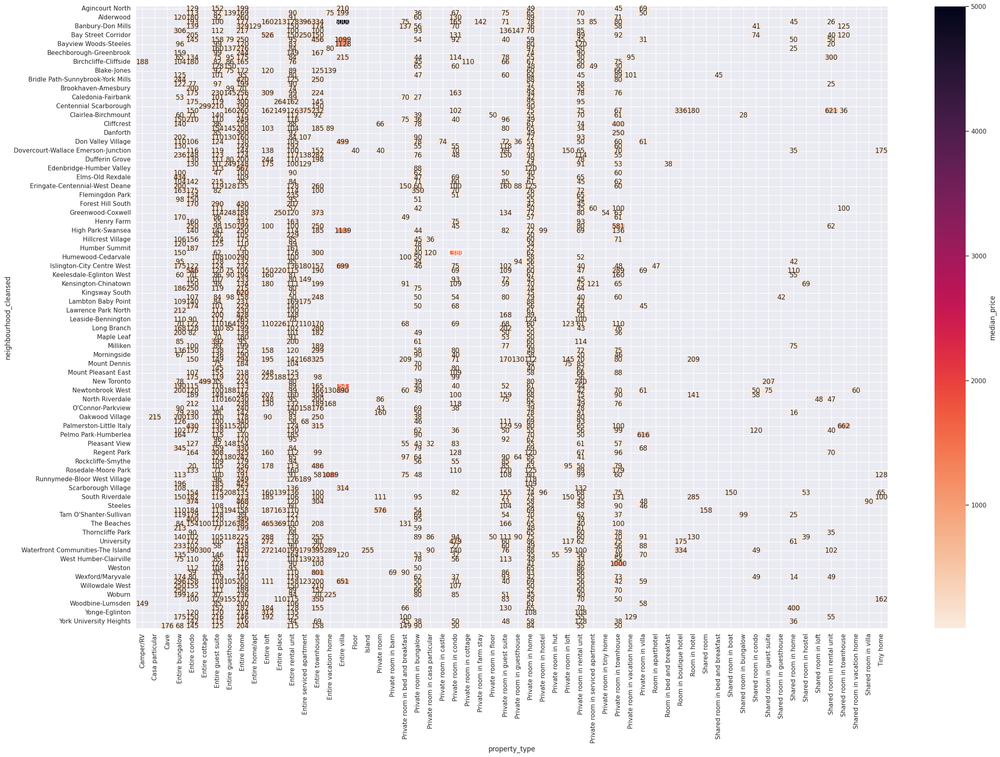

In [10]:
# Plotting a heatmap of the neighbourhoods vs property type with the median price

plt.figure(figsize=(30,20))
sb.heatmap(listingDF.groupby([
        'neighbourhood_cleansed', 'property_type']).price.median().unstack(),annot=True, fmt=".0f", cmap = sb.cm.rocket_r, cbar_kws={'label': 'median_price'})

A heatmap was plotted to give a short and quick intuition of whether location plays a part in price of the listing. From the heatmap above, we can infer 2 things. First is that the **majority of listing of types entire guest suite, entire home, private room in home, private room in rental unipt are listed in almost all neighbourhoods**. The second thing we can infer is that there are **some neighbourhood rows which tend to be darker than other neighbourhood rows** in the heatmap above. This could possibly mean location might have some influence in the price. So, we will analyze this further.

### Analysing number of listings of each room type in the neighbourhoods

In [12]:
import ee
import folium

# Authenticate and initialize Earth Engine
ee.Authenticate()
ee.Initialize()

# Assuming you have a DataFrame with columns 'latitude', 'longitude', 'room_type', 'neighborhood'
# Replace df with your actual DataFrame
df = pd.DataFrame({
    'latitude': listingDF['latitude'],
    'longitude': listingDF['longitude'],
    'room_type': listingDF['room_type'],
    'neighborhood': listingDF['neighbourhood_cleansed']  # Add the neighborhood column
})

# Create a map centered around Toronto
map_center = [43.70, -79.42]
map_zoom = 10
m = folium.Map(location=map_center, zoom_start=map_zoom)

# Add markers for each room type with labels
for index, row in df.iterrows():
    color = 'blue' if row['room_type'] == 'Entire home/apt' else 'red' if row['room_type'] == 'Private room' else 'green' if row['room_type'] == 'Shared room' else 'purple'

    # Add a label with neighborhood and room type information
    label = f"{row['neighborhood']} - {row['room_type']}"

    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        tooltip=label  # Use tooltip to display label on hover
    ).add_to(m)

# Display the map
m


To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://code.earthengine.google.com/client-auth?scopes=https%3A//www.googleapis.com/auth/earthengine%20https%3A//www.googleapis.com/auth/devstorage.full_control&request_id=MdANkeiH-op50EPpdyiYiZUBSqdbyRaXDJrcAN3JcFY&tc=_j_h1HOhaCFfw8jwAsdGGyw5wjmMS0qz2PUXvyPY_YI&cc=Qf3fORIOOQlAvjJABzldDhZH47obB8nuw4ecIHyXyu0

The authorization workflow will generate a code, which you should paste in the box below.
Enter verification code: 4/1AfJohXmQo9wt95SJWANM1ZOmig-GLVKQy_xvskbTle3Cu31z9OKN3kkhwQ8

Successfully saved authorization token.


Blue cirles represents entire house/apartments, red circles represent private rooms and green circles represent shared rooms. From the points on the map above, we can see that most of the blue cirles are concentrated in near ontario lake. That is, most of the listings that list the entire house/apartment are concentrated in neighbourhoods like 'Waterfront Communities-The Island', 'Niagara', 'Trinity-Bellwoods', 'Church-Yonge Corridor'.

### Finding the number of listings for each neighbourhood and median price

In [17]:
# Grouping neighbourhood by number of listings and then cleaning them

neighbourhood_DF=listingDF.groupby('neighbourhood_cleansed').id.count()
neighbourhood_DF=neighbourhood_DF.reset_index()
neighbourhood_DF=neighbourhood_DF.rename(columns={'id':'Number_Of_Listings'})
neighbourhood_DF=neighbourhood_DF.sort_values('Number_Of_Listings',ascending=[0])
neighbourhood_DF.head()

,neighbourhood_cleansed,Number_Of_Listings
122,Waterfront Communities-The Island,2037
87,Niagara,471
3,Annex,380
119,Trinity-Bellwoods,327
23,Church-Yonge Corridor,301


In [18]:
# Grouping neighbourhood by average price of listings and cleaning them

neighbourhoodPrice_DF=listingDF.groupby('neighbourhood_cleansed').price.median()
neighbourhoodPrice_DF=neighbourhoodPrice_DF.reset_index()
neighbourhoodPrice_DF=neighbourhoodPrice_DF.rename(columns={'price':'Median_Price'})
neighbourhoodPrice_DF=neighbourhoodPrice_DF.sort_values('Median_Price',ascending=[0])
neighbourhoodPrice_DF.head()

,neighbourhood_cleansed,Median_Price
16,Bridle Path-Sunnybrook-York Mills,242.0
122,Waterfront Communities-The Island,188.0
107,Rustic,175.0
21,Casa Loma,174.0
87,Niagara,170.0


In [19]:
# Merging the two dataframes

mergeDF=pd.merge(neighbourhood_DF,neighbourhoodPrice_DF,on='neighbourhood_cleansed')
mergeDF.head()

,neighbourhood_cleansed,Number_Of_Listings,Median_Price
0,Waterfront Communities-The Island,2037,188.0
1,Niagara,471,170.0
2,Annex,380,146.5
3,Trinity-Bellwoods,327,120.0
4,Church-Yonge Corridor,301,135.0


Text(0, 0.5, 'Number_Of_Listings')

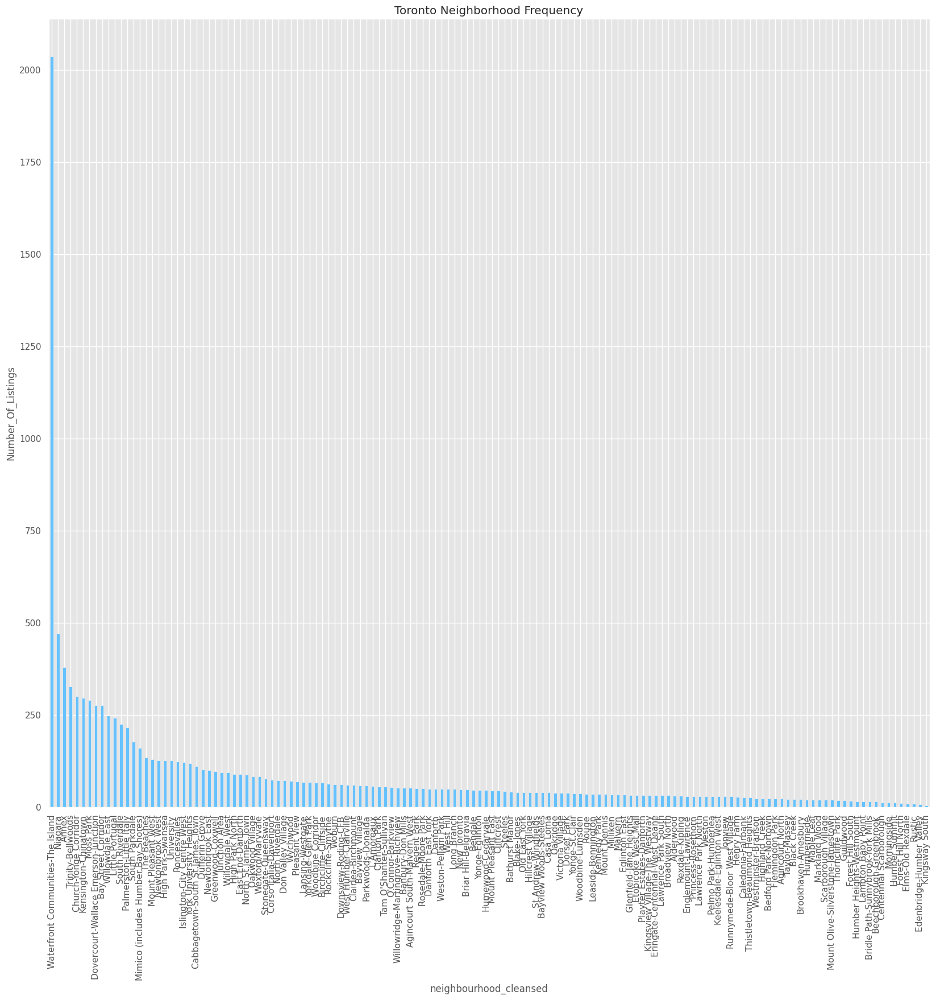

In [22]:
# Visualizing the number of listings for each neighbourhood
matplotlib.style.use('ggplot')

objects = neighbourhood_DF['neighbourhood_cleansed']
y_pos = neighbourhood_DF['Number_Of_Listings']

neighbourhood_DF.plot(kind='bar',
           x='neighbourhood_cleansed',
           y='Number_Of_Listings',
           color = '#66c2ff',
           figsize =(20,18),
           title = 'Toronto Neighborhood Frequency',
           legend = False)

plt.ylabel('Number_Of_Listings')

We can see that most of the listings appear in 'Waterfront Communities-The Island', 'Niagara', 'Trinity-Bellwoods', 'Church-Yonge Corridor'etc. This gives us a good insight into the potential neighbourhoods where there are high number of listings. Our next step would be to analyze it with the price.

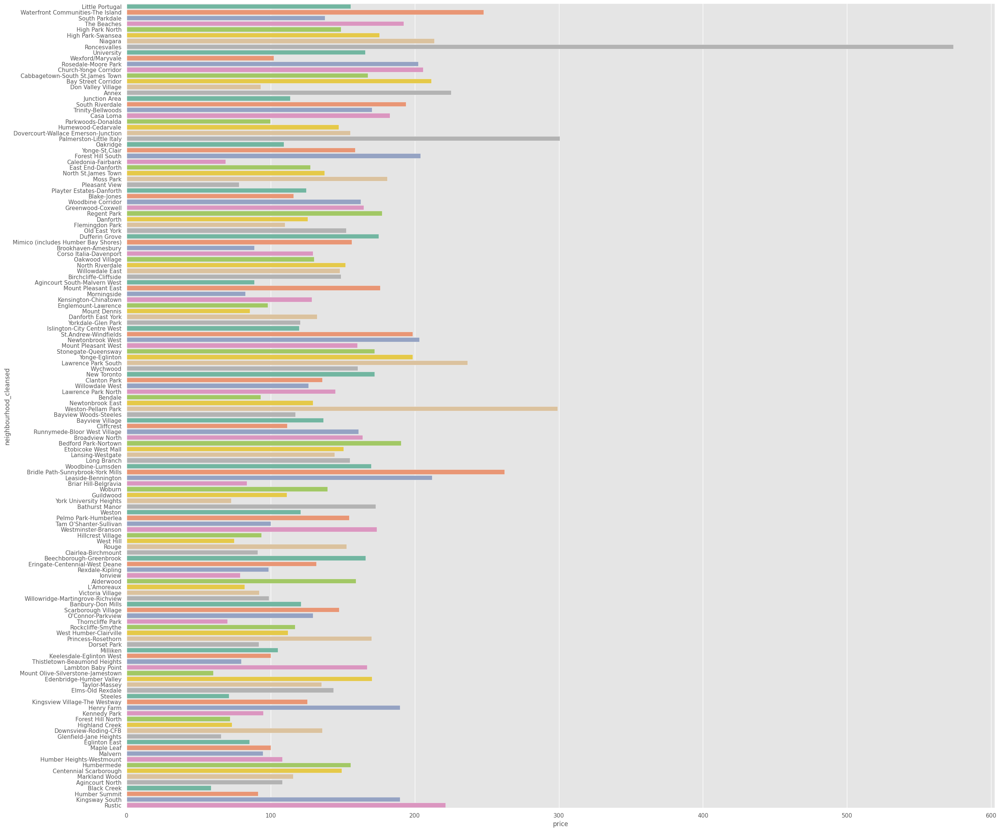

In [38]:
plt.figure(figsize=(30, 28))
sb.barplot(x="price", y="neighbourhood_cleansed", data=listingDF, errorbar=None, palette="Set2")
plt.show()


Text(0, 0.5, 'Median Price')

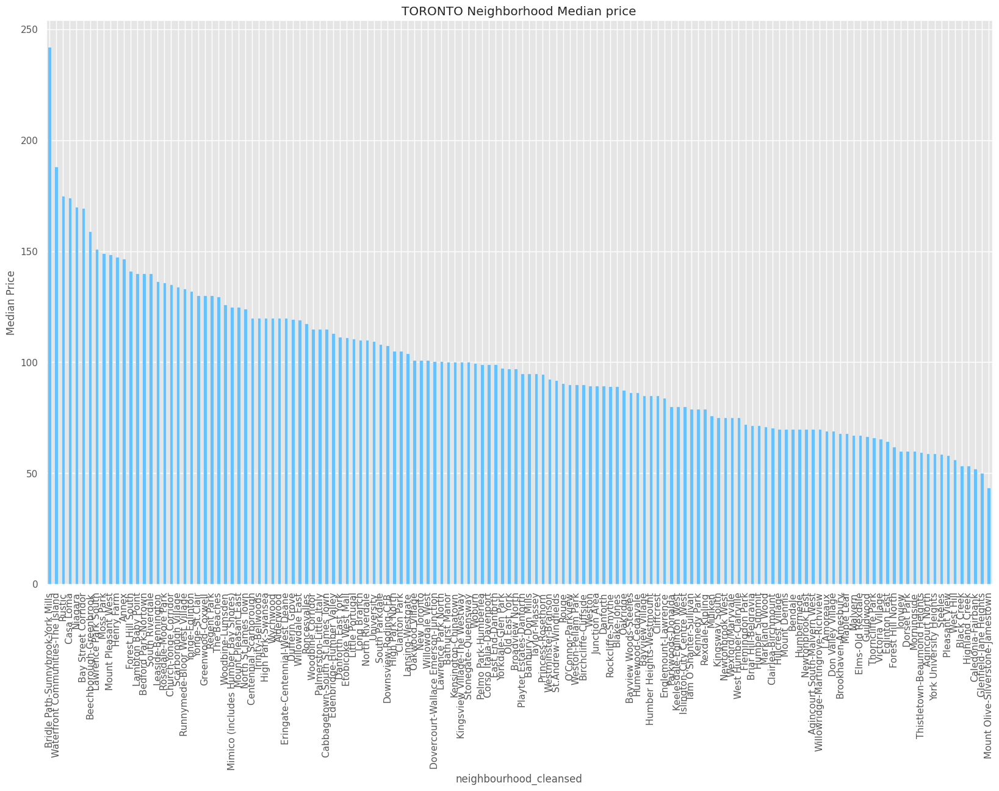

In [41]:
matplotlib.style.use('ggplot')

objects = neighbourhoodPrice_DF['neighbourhood_cleansed']
y_pos = neighbourhoodPrice_DF['Median_Price']

neighbourhoodPrice_DF.plot(kind='bar',
           x='neighbourhood_cleansed',
           y='Median_Price',
           color = '#66c2ff',
           figsize =(20,12),
           title = 'TORONTO Neighborhood Median price',
           legend = False)

plt.ylabel('Median Price')

By analyzing the number of listings and prices for each neighborhood, we can get a clearer understanding of which neighbourhoods have a lot of expensive listings. Looking at the analysis done so far, we can see that certain neighbourhoods are indeed more 'expensive' than others. However, some of those neighbourhoods do not have as many listings as other expensive neighbourhoods. Since our problem was to identify factors that make a listing more expensive, we can infer that these neighbourhoods tend to have more expensive listings. However, a more thorough inference would be to identify neighbourhoods that have both a higher number of listings and higher price as lower number of listings would mean fewer available listing for a customer to choose.

As such, neighbourhoods such as 'Waterfront Communities-The Island', 'Niagara' are neighbourhoods that have a lot of expensive listings.